
# 🍓 Improved RetinaNet for Ripe Strawberry Detection

- TorchVision RetinaNet (ResNet50-FPN) warm-start (COCO)
- 1 class (+bg), multi-scale, medium anchors
- AMP + StepLR + EarlyStopping + Best checkpoint
- Eval @ IoU=0.5 (PR, F1), grid-search (NMS x threshold)
- Calibrated inference (score_thresh, NMS), batch visualization



# 1) Setup & paths

In [1]:
import os, json, time, random, math
from pathlib import Path
import numpy as np
from PIL import Image, ImageDraw

import torch, torchvision
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T
from torchvision.models.detection import retinanet_resnet50_fpn_v2
from torchvision.models.detection.anchor_utils import AnchorGenerator
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
from torchvision.ops import nms
import matplotlib.pyplot as plt

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("PyTorch:", torch.__version__, "| TorchVision:", torchvision.__version__, "| Device:", DEVICE)

# Repro
SEED=42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if DEVICE=="cuda": torch.cuda.manual_seed_all(SEED)

# Paths (match your repo layout)
ROOT = Path(".").resolve()
DATASET_DIR = ROOT / "dataset"
IMAGES_DIR  = DATASET_DIR / "images"
COCO_TRAIN  = DATASET_DIR / "coco_train.json"
COCO_VAL    = DATASET_DIR / "coco_val.json"

OUTPUT_DIR = ROOT / "output_improved"
CKPT_DIR   = OUTPUT_DIR / "checkpoints"
PREDS_DIR  = OUTPUT_DIR / "preds"
PLOTS_DIR  = OUTPUT_DIR / "plots"
for d in [OUTPUT_DIR, CKPT_DIR, PREDS_DIR, PLOTS_DIR]:
    d.mkdir(parents=True, exist_ok=True)

NUM_CLASSES = 2  # strawberry + background
CLASS_NAME  = {1: "strawberry"}


PyTorch: 2.5.1+cu121 | TorchVision: 0.20.1+cu121 | Device: cuda



## 2) Dataset (basename-safe) + transforms (no flip)


In [2]:
class CocoLikeStrawberry(Dataset):
    """COCO-like dataset for TorchVision detection; uses only basename of file_name."""
    def __init__(self, images_dir: Path, coco_json: Path, transforms=None):
        super().__init__()
        self.images_dir = Path(images_dir)
        self.transforms = transforms

        with open(coco_json, "r") as f:
            coco = json.load(f)
        self.images = {im["id"]: im for im in coco["images"]}

        by_img = {}
        for a in coco["annotations"]:
            if a.get("iscrowd", 0) == 1: 
                continue
            by_img.setdefault(a["image_id"], []).append(a)
        self.anns_by_img = by_img

        def exists(meta):
            fn = Path(meta["file_name"]).name
            return (self.images_dir / fn).exists()
        self.ids = [img_id for img_id, meta in self.images.items() if exists(meta)]

    def __len__(self): return len(self.ids)

    def __getitem__(self, idx):
        img_id = self.ids[idx]
        meta   = self.images[img_id]
        fn     = Path(meta["file_name"]).name
        path   = self.images_dir / fn

        img = Image.open(path).convert("RGB")
        w,h = img.size

        anns = self.anns_by_img.get(img_id, [])
        boxes, labels, areas, iscrowd = [], [], [], []
        for a in anns:
            x,y,bw,bh = a["bbox"]
            x1,y1,x2,y2 = x, y, x+bw, y+bh
            x1 = max(0, min(x1, w-1)); y1 = max(0, min(y1, h-1))
            x2 = max(0, min(x2, w-1)); y2 = max(0, min(y2, h-1))
            if x2 <= x1 or y2 <= y1: 
                continue
            boxes.append([x1,y1,x2,y2]); labels.append(1); areas.append(bw*bh); iscrowd.append(0)

        target = {
            "boxes": torch.as_tensor(boxes, dtype=torch.float32),
            "labels": torch.as_tensor(labels, dtype=torch.int64) if labels else torch.zeros((0,), dtype=torch.int64),
            "image_id": torch.tensor([img_id]),
            "area": torch.as_tensor(areas, dtype=torch.float32) if areas else torch.zeros((0,), dtype=torch.float32),
            "iscrowd": torch.as_tensor(iscrowd, dtype=torch.int64) if iscrowd else torch.zeros((0,), dtype=torch.int64),
        }
        if self.transforms: img = self.transforms(img)
        return img, target, path

# Train-only light color jitter; val is clean
train_tfms = T.Compose([
    T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1, hue=0.02),
    T.ToTensor(),
])
val_tfms = T.Compose([T.ToTensor()])

def collate_fn(batch):
    images, targets, paths = list(zip(*batch))
    return list(images), list(targets), list(paths)


In [3]:
# --- Auto-detect images dir from COCO, then build datasets/loaders ------------
def detect_images_dir_from_coco(coco_json: Path, default_dir: Path, search_roots=None, sample=20):
    with open(coco_json, "r") as f:
        coco = json.load(f)
    names = [Path(im["file_name"]).name for im in coco["images"]][:sample]
    ok = sum((default_dir / n).exists() for n in names)
    if ok > 0: return default_dir
    if search_roots is None:
        search_roots = [DATASET_DIR / "images", DATASET_DIR, ROOT]
    for base in search_roots:
        hits = sum(1 for n in names if list(base.rglob(n)))
        if hits > 0: return list(base.rglob(names[0]))[0].parent
    return None

def preview_json(coco_json: Path, images_dir: Path):
    with open(coco_json, "r") as f:
        coco = json.load(f)
    total = len(coco["images"])
    exists = sum((images_dir / Path(im["file_name"]).name).exists() for im in coco["images"])
    print(f"{coco_json.name}: images={total}, files_found_under[{images_dir}]: {exists}")

new_dir = detect_images_dir_from_coco(COCO_TRAIN, IMAGES_DIR)
if new_dir and new_dir != IMAGES_DIR:
    print("Detected images dir:", new_dir)
    IMAGES_DIR = new_dir

preview_json(COCO_TRAIN, IMAGES_DIR)
preview_json(COCO_VAL,   IMAGES_DIR)

NUM_WORKERS = 0  # bump to 2 if stable on your Windows env
BATCH_SIZE  = 4

train_ds = CocoLikeStrawberry(IMAGES_DIR, COCO_TRAIN, transforms=train_tfms)
val_ds   = CocoLikeStrawberry(IMAGES_DIR, COCO_VAL,   transforms=val_tfms)
print("Train images:", len(train_ds), "| Val images:", len(val_ds))

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=NUM_WORKERS, collate_fn=collate_fn)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, collate_fn=collate_fn)


coco_train.json: images=32, files_found_under[C:\Users\bweil\projects\ripe-strawberry-detector\dataset\images]: 32
coco_val.json: images=8, files_found_under[C:\Users\bweil\projects\ripe-strawberry-detector\dataset\images]: 8
Train images: 32 | Val images: 8


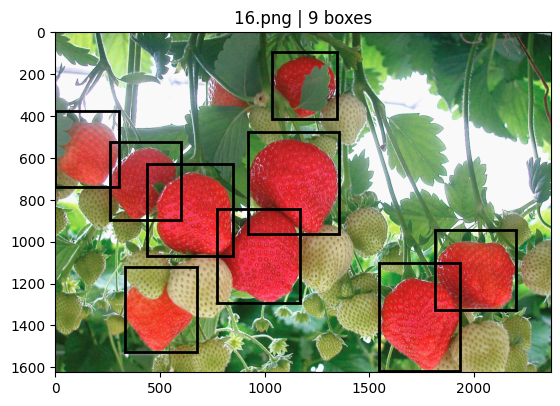

In [4]:
import random, matplotlib.pyplot as plt
img, tgt, path = train_ds[random.randrange(len(train_ds))]
fig, ax = plt.subplots()
ax.imshow(img.permute(1,2,0))
for (x1,y1,x2,y2) in tgt["boxes"]:
    ax.add_patch(plt.Rectangle((x1,y1), x2-x1, y2-y1, fill=False, linewidth=2))
ax.set_title(path.name + f" | {len(tgt['boxes'])} boxes")
plt.show()


## Model (warm-start COCO) + medium anchors + multi-scale


In [5]:
def _get_head_in_channels(model):
    blk0 = model.head.classification_head.conv[0]
    for path in ["0", "conv", "project"]:
        if hasattr(blk0, path):
            inner = getattr(blk0, path)
            if hasattr(inner, "in_channels"): return inner.in_channels
    return 256

def build_model_warmstart(num_classes=2, anchor_variant="medium"):
    base = retinanet_resnet50_fpn_v2(
        weights="DEFAULT", weights_backbone=None,
        min_size=[600,700,800,900], max_size=1333
    )
    if anchor_variant == "medium":
        anchor_sizes = (
            (16,32,64), (32,64,128), (64,128,256), (128,256,512), (256,512,1024)
        )
    elif anchor_variant == "small":
        anchor_sizes = (
            (8,16,32), (16,32,64), (32,64,128), (64,128,256), (128,256,512)
        )
    else:  # default-ish
        anchor_sizes = (
            (32,64,128), (64,128,256), (128,256,512), (256,512,1024), (512,1024,2048)
        )
    aspect_ratios = ((0.5,1.0,2.0),) * len(anchor_sizes)
    custom = AnchorGenerator(sizes=anchor_sizes, aspect_ratios=aspect_ratios)
    base.anchor_generator = custom

    num_anchors = custom.num_anchors_per_location()[0]
    in_ch = _get_head_in_channels(base)
    base.head.classification_head = RetinaNetClassificationHead(in_ch, num_anchors, num_classes)

    base.score_thresh = 0.0  # permissive by default (eval will sweep)
    return base.to(DEVICE)

model = build_model_warmstart(num_classes=NUM_CLASSES, anchor_variant="medium")
print("Warm-started RetinaNet (multi-scale, medium anchors).")


Warm-started RetinaNet (multi-scale, medium anchors).



## 3) Training Utilities



In [6]:
class EarlyStopper:
    def __init__(self, patience=8, min_delta=0.0):
        self.patience=patience; self.min_delta=min_delta
        self.counter=0; self.best=float("inf")
    def step(self, metric):
        if metric < self.best - self.min_delta:
            self.best=metric; self.counter=0; return False
        self.counter += 1; return self.counter > self.patience

def train_one_epoch(model, loader, optimizer, scaler):
    model.train(); tot=0.0
    for images, targets, _ in loader:
        images = [x.to(DEVICE) for x in images]
        targets= [{k:v.to(DEVICE) for k,v in t.items()} for t in targets]
        optimizer.zero_grad(set_to_none=True)
        with torch.cuda.amp.autocast(enabled=(DEVICE=="cuda")):
            loss_dict = model(images, targets)
            loss = sum(loss_dict.values())
        scaler.scale(loss).backward()
        scaler.step(optimizer); scaler.update()
        tot += float(loss.detach().item())
    return tot / max(1,len(loader))

@torch.no_grad()
def evaluate_loss(model, loader):
    was_training = model.training
    model.train()
    tot=0.0
    for images, targets, _ in loader:
        images = [x.to(DEVICE) for x in images]
        targets= [{k:v.to(DEVICE) for k,v in t.items()} for t in targets]
        loss_dict = model(images, targets)
        tot += float(sum(loss_dict.values()).item())
    if not was_training: model.eval()
    return tot / max(1,len(loader))


In [7]:
# --- Optimizer / Scheduler tuned for warm-start --------------------------------
LR_BACKBONE = 1e-4
LR_HEAD     = 1e-3
WEIGHT_DECAY= 1e-4
EPOCHS      = 40
PATIENCE    = 8
STEP_SIZE   = 8

backbone_params = [p for p in model.backbone.parameters() if p.requires_grad]
head_params     = [p for p in model.head.parameters() if p.requires_grad]

optimizer = torch.optim.SGD(
    [{"params": backbone_params, "lr": LR_BACKBONE},
     {"params": head_params,     "lr": LR_HEAD}],
    momentum=0.9, weight_decay=WEIGHT_DECAY
)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=0.1)
scaler    = torch.cuda.amp.GradScaler(enabled=(DEVICE=="cuda"))
early     = EarlyStopper(patience=PATIENCE, min_delta=0.0)

CKPT_BEST = CKPT_DIR / "retinanet_best.pt"
CKPT_LAST = CKPT_DIR / "retinanet_last.pt"
best_val  = float("inf")
history   = {"train_loss": [], "val_loss": []}


C:\Users\bweil\AppData\Local\Temp\ipykernel_9500\3439892336.py:18: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler    = torch.cuda.amp.GradScaler(enabled=(DEVICE=="cuda"))


C:\Users\bweil\AppData\Local\Temp\ipykernel_9500\329656814.py:16: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE=="cuda")):


Epoch 01 | train 1.4979 | val 1.4770 | lr 1.00e-04 (best) | 42.0s
Epoch 02 | train 1.4591 | val 1.4043 | lr 1.00e-04 (best) | 63.0s
Epoch 03 | train 1.3641 | val 1.2534 | lr 1.00e-04 (best) | 33.2s
Epoch 04 | train 1.1713 | val 1.0371 | lr 1.00e-04 (best) | 29.0s
Epoch 05 | train 1.0532 | val 0.9001 | lr 1.00e-04 (best) | 29.2s
Epoch 06 | train 0.9763 | val 0.9429 | lr 1.00e-04 | 18.2s
Epoch 07 | train 0.9498 | val 0.8362 | lr 1.00e-04 (best) | 39.3s
Epoch 08 | train 0.8838 | val 0.8492 | lr 1.00e-05 | 17.6s
Epoch 09 | train 0.8612 | val 0.8505 | lr 1.00e-05 | 19.0s
Epoch 10 | train 0.8248 | val 0.8105 | lr 1.00e-05 (best) | 50.8s
Epoch 11 | train 0.7996 | val 0.8182 | lr 1.00e-05 | 36.2s
Epoch 12 | train 0.8236 | val 0.7810 | lr 1.00e-05 (best) | 27.6s
Epoch 13 | train 0.7926 | val 0.8150 | lr 1.00e-05 | 26.8s
Epoch 14 | train 0.8080 | val 0.7677 | lr 1.00e-05 (best) | 40.3s
Epoch 15 | train 0.8163 | val 0.7703 | lr 1.00e-05 | 33.2s
Epoch 16 | train 0.7826 | val 0.7828 | lr 1.00e-06 |

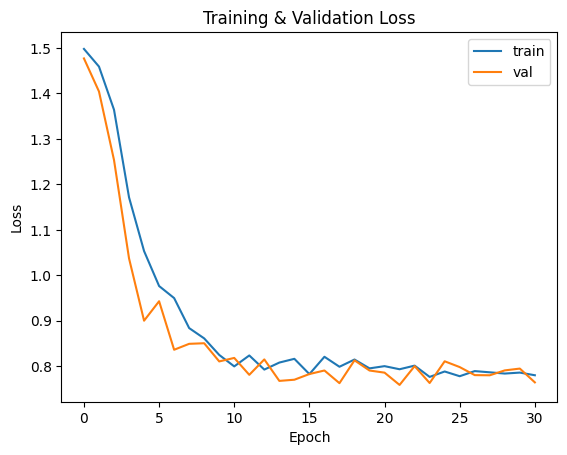

Saved: C:\Users\bweil\projects\ripe-strawberry-detector\output_improved\plots\loss_curves.png


In [8]:

# --- Train Loop ---------------------------------------------------------------
for epoch in range(1, EPOCHS+1):
    t0=time.time()
    tr = train_one_epoch(model, train_loader, optimizer, scaler)
    va = evaluate_loss(model, val_loader)
    scheduler.step()
    history["train_loss"].append(tr); history["val_loss"].append(va)
    torch.save(model.state_dict(), CKPT_LAST)
    tag=""
    if va < best_val:
        best_val = va; torch.save(model.state_dict(), CKPT_BEST); tag=" (best)"
    print(f"Epoch {epoch:02d} | train {tr:.4f} | val {va:.4f} | lr {scheduler.get_last_lr()[0]:.2e}{tag} | {time.time()-t0:.1f}s")
    if early.step(va):
        print(f"Early stopping at epoch {epoch}. Best val {best_val:.4f}")
        break

plt.figure()
plt.plot(history["train_loss"], label="train")
plt.plot(history["val_loss"], label="val")
plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title("Training & Validation Loss")
plt.legend(); path = PLOTS_DIR / "loss_curves.png"
plt.savefig(path.as_posix(), bbox_inches="tight"); plt.show()
print("Saved:", path)



## 4) Evaluation @ IoU 0.5 + Threshold Sweep
Computes **Precision, Recall, F1** for a range of confidence thresholds, then plots:
- **Precision–Recall curve**
- **F1 vs Threshold**

We pick the operating point that **maximizes F1** by default.


In [9]:
# --- DIAGNOSTIC: do we get ANY predictions? -------------------------------
@torch.no_grad()
def infer_batch(model, images):
    model.eval()
    outs = model([x.to(DEVICE) for x in images])
    res=[]
    for o in outs:
        res.append({
            "boxes":  o["boxes"].detach().cpu(),
            "scores": o["scores"].detach().cpu(),
            "labels": o["labels"].detach().cpu(),
        })
    return res

def iou_xyxy(a,b):
    xA=max(a[0],b[0]); yA=max(a[1],b[1])
    xB=min(a[2],b[2]); yB=min(a[3],b[3])
    inter=max(0,xB-xA)*max(0,yB-yA)
    if inter<=0: return 0.0
    areaA=max(0,a[2]-a[0])*max(0,a[3]-a[1])
    areaB=max(0,b[2]-b[0])*max(0,b[3]-b[1])
    uni=areaA+areaB-inter
    return 0.0 if uni<=0 else inter/uni

def evaluate_at_threshold(model, loader, conf_thr=0.5, iou_thr=0.5):
    TP=FP=FN=0; any_pred=False
    for images, targets, _ in loader:
        preds = infer_batch(model, images)
        for i in range(len(images)):
            gt = targets[i]["boxes"].numpy()
            used = np.zeros(len(gt), dtype=bool)
            p = preds[i]
            sel = (p["scores"].numpy() >= conf_thr) & (p["labels"].numpy()==1)
            boxes = p["boxes"].numpy()[sel]
            if len(boxes)>0: any_pred=True
            for b in boxes:
                best, idx = 0.0, -1
                for j,g in enumerate(gt):
                    if used[j]: continue
                    ii = iou_xyxy(b,g)
                    if ii>best: best, idx = ii, j
                if best>=iou_thr and idx>=0:
                    TP+=1; used[idx]=True
                else:
                    FP+=1
            FN+=int((~used).sum())
    P = TP/(TP+FP) if (TP+FP)>0 else 0.0
    R = TP/(TP+FN) if (TP+FN)>0 else 0.0
    F1= 2*P*R/(P+R) if (P+R)>0 else 0.0
    return P,R,F1,TP,FP,FN,any_pred

# Load best & neutralize internal filters for evaluation
if CKPT_BEST.exists():
    model.load_state_dict(torch.load(CKPT_BEST, map_location=DEVICE))
    print("Loaded best:", CKPT_BEST)
model.eval()
if hasattr(model,"score_thresh"):        model.score_thresh=0.0
if hasattr(model,"detections_per_img"):  model.detections_per_img=300
if hasattr(model,"nms_thresh"):          model.nms_thresh=0.50
print("Eval setup: score_thresh=0.0, nms=0.50, det_per_img=300")


Loaded best: C:\Users\bweil\projects\ripe-strawberry-detector\output_improved\checkpoints\retinanet_best.pt
Eval setup: score_thresh=0.0, nms=0.50, det_per_img=300


C:\Users\bweil\AppData\Local\Temp\ipykernel_9500\4092817690.py:54: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(CKPT_BEST, map_location=DEV

thr=0.05 | P=0.078 R=0.897 F1=0.143 | TP=87 FP=1031 FN=10
thr=0.10 | P=0.088 R=0.876 F1=0.160 | TP=85 FP=878 FN=12
thr=0.15 | P=0.104 R=0.876 F1=0.185 | TP=85 FP=735 FN=12
thr=0.20 | P=0.147 R=0.814 F1=0.249 | TP=79 FP=458 FN=18
thr=0.25 | P=0.226 R=0.794 F1=0.352 | TP=77 FP=263 FN=20
thr=0.30 | P=0.297 R=0.722 F1=0.420 | TP=70 FP=166 FN=27
thr=0.35 | P=0.368 R=0.577 F1=0.450 | TP=56 FP=96 FN=41
thr=0.40 | P=0.410 R=0.495 F1=0.449 | TP=48 FP=69 FN=49
thr=0.45 | P=0.452 R=0.340 F1=0.388 | TP=33 FP=40 FN=64
thr=0.50 | P=0.510 R=0.268 F1=0.351 | TP=26 FP=25 FN=71
thr=0.55 | P=0.533 R=0.165 F1=0.252 | TP=16 FP=14 FN=81
thr=0.60 | P=0.600 R=0.124 F1=0.205 | TP=12 FP=8 FN=85
thr=0.65 | P=0.462 R=0.062 F1=0.109 | TP=6 FP=7 FN=91
thr=0.70 | P=0.800 R=0.041 F1=0.078 | TP=4 FP=1 FN=93
thr=0.75 | P=0.500 R=0.010 F1=0.020 | TP=1 FP=1 FN=96
thr=0.80 | P=0.000 R=0.000 F1=0.000 | TP=0 FP=0 FN=97
thr=0.85 | P=0.000 R=0.000 F1=0.000 | TP=0 FP=0 FN=97
thr=0.90 | P=0.000 R=0.000 F1=0.000 | TP=0 FP=0 FN=9

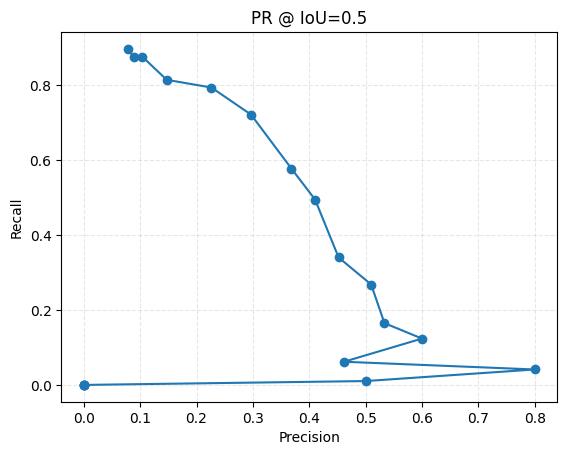

Saved: C:/Users/bweil/projects/ripe-strawberry-detector/output_improved/plots/pr_curve_iou05.png


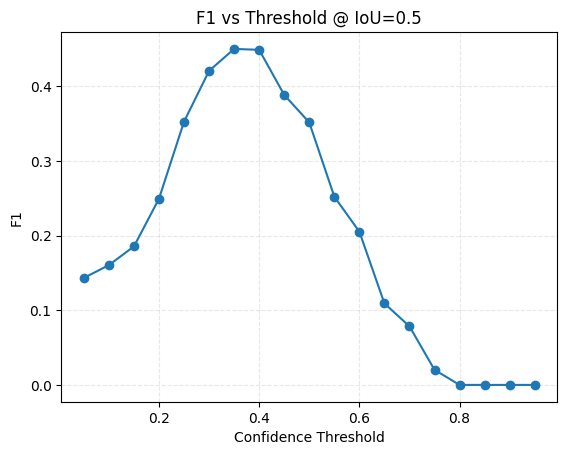

Saved: C:/Users/bweil/projects/ripe-strawberry-detector/output_improved/plots/f1_vs_thr_iou05.png


In [10]:
ths = np.linspace(0.05,0.95,19)
rows=[]
for t in ths:
    P,R,F1,TP,FP,FN,_ = evaluate_at_threshold(model, val_loader, conf_thr=float(t), iou_thr=0.5)
    rows.append((t,P,R,F1,TP,FP,FN))
    print(f"thr={t:.2f} | P={P:.3f} R={R:.3f} F1={F1:.3f} | TP={TP} FP={FP} FN={FN}")
rows=np.array(rows,float)
best_idx = rows[:,3].argmax()
best_thr, best_P, best_R, best_F1 = rows[best_idx,0], rows[best_idx,1], rows[best_idx,2], rows[best_idx,3]
print(f"\nBest by F1 @ IoU=0.5: thr={best_thr:.2f} | P={best_P:.3f} R={best_R:.3f} F1={best_F1:.3f}")

plt.figure(); plt.plot(rows[:,1],rows[:,2],marker="o")
plt.xlabel("Precision"); plt.ylabel("Recall"); plt.title("PR @ IoU=0.5"); plt.grid(True,ls="--",alpha=0.3)
pp = (PLOTS_DIR / "pr_curve_iou05.png").as_posix(); plt.savefig(pp,bbox_inches="tight"); plt.show(); print("Saved:", pp)

plt.figure(); plt.plot(rows[:,0],rows[:,3],marker="o")
plt.xlabel("Confidence Threshold"); plt.ylabel("F1"); plt.title("F1 vs Threshold @ IoU=0.5"); plt.grid(True,ls="--",alpha=0.3)
pp = (PLOTS_DIR / "f1_vs_thr_iou05.png").as_posix(); plt.savefig(pp,bbox_inches="tight"); plt.show(); print("Saved:", pp)


# 5) Grid search NMS × Threshold @ IoU=0.5

In [11]:
# Optional but recommended once: tune NMS with threshold
thr_grid = np.round(np.linspace(0.40,0.70,16),2)
nms_grid = [0.40,0.45,0.50,0.55,0.60]
best = {"F1":-1}
for nmsv in nms_grid:
    if hasattr(model,"nms_thresh"): model.nms_thresh=float(nmsv)
    for thr in thr_grid:
        P,R,F1,TP,FP,FN,_ = evaluate_at_threshold(model, val_loader, conf_thr=float(thr), iou_thr=0.5)
        print(f"nms={nmsv:.2f} thr={thr:.2f} | P={P:.3f} R={R:.3f} F1={F1:.3f}")
        if F1>best["F1"]: best={"nms":nmsv,"thr":float(thr),"P":P,"R":R,"F1":F1}
print("\nBEST grid @ IoU=0.5:", best)


nms=0.40 thr=0.40 | P=0.453 R=0.495 F1=0.473
nms=0.40 thr=0.42 | P=0.458 R=0.392 F1=0.422
nms=0.40 thr=0.44 | P=0.472 R=0.351 F1=0.402
nms=0.40 thr=0.46 | P=0.516 R=0.330 F1=0.403
nms=0.40 thr=0.48 | P=0.528 R=0.289 F1=0.373
nms=0.40 thr=0.50 | P=0.553 R=0.268 F1=0.361
nms=0.40 thr=0.52 | P=0.600 R=0.216 F1=0.318
nms=0.40 thr=0.54 | P=0.567 R=0.175 F1=0.268
nms=0.40 thr=0.56 | P=0.571 R=0.165 F1=0.256
nms=0.40 thr=0.58 | P=0.600 R=0.155 F1=0.246
nms=0.40 thr=0.60 | P=0.632 R=0.124 F1=0.207
nms=0.40 thr=0.62 | P=0.600 R=0.093 F1=0.161
nms=0.40 thr=0.64 | P=0.500 R=0.062 F1=0.110
nms=0.40 thr=0.66 | P=0.545 R=0.062 F1=0.111
nms=0.40 thr=0.68 | P=0.556 R=0.052 F1=0.094
nms=0.40 thr=0.70 | P=0.800 R=0.041 F1=0.078
nms=0.45 thr=0.40 | P=0.421 R=0.495 F1=0.455
nms=0.45 thr=0.42 | P=0.432 R=0.392 F1=0.411
nms=0.45 thr=0.44 | P=0.459 R=0.351 F1=0.398
nms=0.45 thr=0.46 | P=0.500 R=0.330 F1=0.398
nms=0.45 thr=0.48 | P=0.519 R=0.289 F1=0.371
nms=0.45 thr=0.50 | P=0.542 R=0.268 F1=0.359
nms=0.45 t

# better nms and threshold

C:\Users\bweil\AppData\Local\Temp\ipykernel_9500\3283137498.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(CKPT_BEST, map_location=DEVI

Loaded best checkpoint: C:\Users\bweil\projects\ripe-strawberry-detector\output_improved\checkpoints\retinanet_best.pt
Collected 2400 scores.
Percentiles: {50: 0.042237741872668266, 70: 0.16436047106981277, 80: 0.2106452822685242, 90: 0.29862870573997496, 95: 0.3938231691718099}


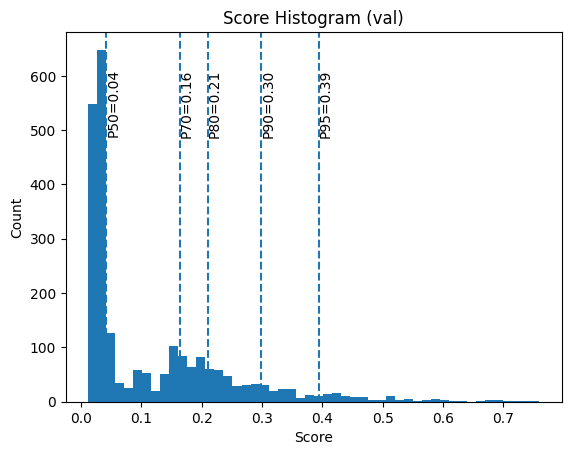

Saved: C:/Users/bweil/projects/ripe-strawberry-detector/output_improved/plots/score_histogram.png


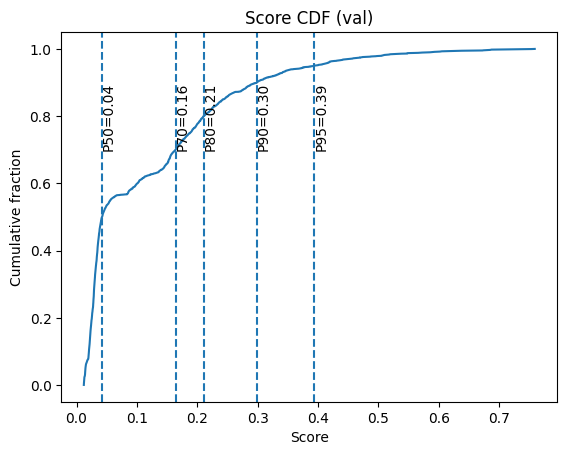

Saved: C:/Users/bweil/projects/ripe-strawberry-detector/output_improved/plots/score_cdf.png

Recommended starting thresholds:
- Clean visuals: use near P95 ≈ 0.39
- Balanced visuals: use near P90 ≈ 0.30


In [16]:
# === Score histogram + CDF (drop-in replacement) ===
# Loads best checkpoint (if present), disables internal score filtering, collects scores,
# plots histogram + CDF with vertical percentile markers, and prints recommendations.

if CKPT_BEST.exists():
    model.load_state_dict(torch.load(CKPT_BEST, map_location=DEVICE))
    print("Loaded best checkpoint:", CKPT_BEST)

model.eval()
# Neutralize internal filters so we see the raw score distribution
if hasattr(model, "score_thresh"):        model.score_thresh = 0.0
if hasattr(model, "detections_per_img"):  model.detections_per_img = 300
if hasattr(model, "nms_thresh"):          model.nms_thresh = 0.50

@torch.no_grad()
def collect_scores(model, loader, take=9999):
    scores = []
    seen = 0
    for images, _, _ in loader:
        out = model([x.to(DEVICE) for x in images])
        for o in out:
            s = o["scores"].detach().cpu().numpy()
            if s.size:
                scores.append(s)
            seen += 1
            if seen >= take:
                break
        if seen >= take:
            break
    if not scores:
        return np.array([])
    return np.concatenate(scores)

scores = collect_scores(model, val_loader, take=8)  # you can increase 'take' to scan more images
if scores.size == 0:
    print("No predictions found while collecting scores.")
else:
    # Percentiles
    percentiles = {p: float(np.percentile(scores, p)) for p in (50, 70, 80, 90, 95)}
    print("Collected", scores.size, "scores.")
    print("Percentiles:", percentiles)

    # ---- Histogram ----
    plt.figure()
    plt.hist(scores, bins=50)
    for p, v in percentiles.items():
        plt.axvline(v, linestyle="--")
        plt.text(v, plt.ylim()[1]*0.9, f"P{p}={v:.2f}", rotation=90, va="top")
    plt.xlabel("Score"); plt.ylabel("Count"); plt.title("Score Histogram (val)")
    hist_path = (PLOTS_DIR / "score_histogram.png").as_posix()
    plt.savefig(hist_path, bbox_inches="tight"); plt.show()
    print("Saved:", hist_path)

    # ---- CDF ----
    plt.figure()
    xs = np.sort(scores); ys = np.arange(1, xs.size+1)/xs.size
    plt.plot(xs, ys)
    for p, v in percentiles.items():
        plt.axvline(v, linestyle="--"); plt.text(v, 0.9, f"P{p}={v:.2f}", rotation=90, va="top")
    plt.xlabel("Score"); plt.ylabel("Cumulative fraction"); plt.title("Score CDF (val)")
    cdf_path = (PLOTS_DIR / "score_cdf.png").as_posix()
    plt.savefig(cdf_path, bbox_inches="tight"); plt.show()
    print("Saved:", cdf_path)

    # Heuristic recommendations (for visuals & a starting point for inference)
    p90 = percentiles[90]; p95 = percentiles[95]
    print(f"\nRecommended starting thresholds:")
    print(f"- Clean visuals: use near P95 ≈ {p95:.2f}")
    print(f"- Balanced visuals: use near P90 ≈ {p90:.2f}")


In [17]:
# === Grid search: NMS × Threshold @ IoU=0.5 ===
# Assumes evaluate_at_threshold(...) is defined above.

# Keep internal score_thresh at 0.0 to avoid double-thresholding during evaluation
if hasattr(model, "score_thresh"): model.score_thresh = 0.0
if hasattr(model, "detections_per_img"): model.detections_per_img = 300

thr_grid = np.round(np.linspace(0.20, 0.60, 21), 2)  # your scores are low; search 0.20→0.60
nms_grid = [0.40, 0.45, 0.50, 0.55]

best = {"F1": -1}
for nmsv in nms_grid:
    if hasattr(model, "nms_thresh"): model.nms_thresh = float(nmsv)
    for thr in thr_grid:
        res = evaluate_at_threshold(model, val_loader, conf_thr=float(thr), iou_thr=0.5)
        # accept 6- or 7-tuple returns
        if len(res) == 6:
            P,R,F1,TP,FP,FN = res
        else:
            P,R,F1,TP,FP,FN,_ = res
        print(f"nms={nmsv:.2f} thr={thr:.2f} | P={P:.3f} R={R:.3f} F1={F1:.3f} | TP={TP} FP={FP} FN={FN}")
        if F1 > best["F1"]:
            best = {"nms": nmsv, "thr": float(thr), "P": P, "R": R, "F1": F1}

print("\nBEST @ IoU=0.5:", best)


nms=0.40 thr=0.20 | P=0.197 R=0.794 F1=0.316 | TP=77 FP=314 FN=20
nms=0.40 thr=0.22 | P=0.239 R=0.794 F1=0.368 | TP=77 FP=245 FN=20
nms=0.40 thr=0.24 | P=0.274 R=0.763 F1=0.403 | TP=74 FP=196 FN=23
nms=0.40 thr=0.26 | P=0.309 R=0.753 F1=0.438 | TP=73 FP=163 FN=24
nms=0.40 thr=0.28 | P=0.346 R=0.753 F1=0.474 | TP=73 FP=138 FN=24
nms=0.40 thr=0.30 | P=0.368 R=0.701 F1=0.482 | TP=68 FP=117 FN=29
nms=0.40 thr=0.32 | P=0.410 R=0.680 F1=0.512 | TP=66 FP=95 FN=31
nms=0.40 thr=0.34 | P=0.441 R=0.649 F1=0.525 | TP=63 FP=80 FN=34
nms=0.40 thr=0.36 | P=0.447 R=0.567 F1=0.500 | TP=55 FP=68 FN=42
nms=0.40 thr=0.38 | P=0.446 R=0.515 F1=0.478 | TP=50 FP=62 FN=47
nms=0.40 thr=0.40 | P=0.453 R=0.495 F1=0.473 | TP=48 FP=58 FN=49
nms=0.40 thr=0.42 | P=0.458 R=0.392 F1=0.422 | TP=38 FP=45 FN=59
nms=0.40 thr=0.44 | P=0.472 R=0.351 F1=0.402 | TP=34 FP=38 FN=63
nms=0.40 thr=0.46 | P=0.516 R=0.330 F1=0.403 | TP=32 FP=30 FN=65
nms=0.40 thr=0.48 | P=0.528 R=0.289 F1=0.373 | TP=28 FP=25 FN=69
nms=0.40 thr=0.50 |

In [20]:
# === 2D grid: F1 @ IoU=0.5 over (nms, thr) ===
import numpy as np, matplotlib.pyplot as plt, csv
from collections import defaultdict

# Ensure eval-neutral internal settings
if hasattr(model, "score_thresh"):        model.score_thresh = 0.0
if hasattr(model, "detections_per_img"):  model.detections_per_img = 300

thr_grid = np.round(np.linspace(0.20, 0.60, 41), 2)   # 0.20..0.60 step=0.01
nms_grid = np.round(np.linspace(0.35, 0.60, 26), 2)   # 0.35..0.60 step=0.01

results = []  # (nms, thr, P, R, F1)
for nmsv in nms_grid:
    if hasattr(model, "nms_thresh"): model.nms_thresh = float(nmsv)
    for thr in thr_grid:
        res = evaluate_at_threshold(model, val_loader, conf_thr=float(thr), iou_thr=0.5)
        P,R,F1,TP,FP,FN = (res[:6] if len(res)>=6 else (0,0,0,0,0,0))
        results.append((float(nmsv), float(thr), float(P), float(R), float(F1)))

# Save CSV for the appendix / reproducibility
csv_path = (PLOTS_DIR / "grid_iou05.csv")
with open(csv_path, "w", newline="") as f:
    w = csv.writer(f); w.writerow(["nms","thr","P","R","F1"])
    for r in results: w.writerow(r)
print("Saved grid CSV:", csv_path)

# Find best
best = max(results, key=lambda r: r[4])
print("BEST @ IoU=0.5:", {"nms": best[0], "thr": best[1], "P": best[2], "R": best[3], "F1": best[4]})

# Show top-5 rows to prove nothing else beats it
top5 = sorted(results, key=lambda r: r[4], reverse=True)[:5]
print("Top 5 (nms, thr, P, R, F1):")
for r in top5: print(r)

# Heatmap (matplotlib only)
# Build a dense matrix F1[nms_i, thr_j]
nms_to_idx = {v:i for i,v in enumerate(nms_grid)}
thr_to_idx = {v:j for j,v in enumerate(thr_grid)}
F1 = np.full((len(nms_grid), len(thr_grid)), np.nan)
for nmsv, thr, P, R, f1 in results:
    F1[nms_to_idx[nmsv], thr_to_idx[thr]] = f1

plt.figure(figsize=(7,5))
im = plt.imshow(F1, origin="lower", aspect="auto",
                extent=[thr_grid.min(), thr_grid.max(), nms_grid.min(), nms_grid.max()])
plt.colorbar(im, label="F1 @ IoU=0.5")
plt.xlabel("Threshold"); plt.ylabel("NMS IoU"); plt.title("F1 heatmap (NMS × Threshold)")

# Mark best
plt.scatter([best[1]], [best[0]], s=60, edgecolors="k", facecolors="none", label="Best")
plt.legend()
heat_path = (PLOTS_DIR / "grid_heatmap_iou05.png").as_posix()
plt.savefig(heat_path, bbox_inches="tight"); plt.show()
print("Saved:", heat_path)

KeyboardInterrupt: 

nms=0.40 thr=0.26 | P=0.309 R=0.753 F1=0.438
nms=0.40 thr=0.27 | P=0.319 R=0.753 F1=0.448
nms=0.40 thr=0.28 | P=0.346 R=0.753 F1=0.474
nms=0.40 thr=0.29 | P=0.359 R=0.722 F1=0.479
nms=0.40 thr=0.30 | P=0.368 R=0.701 F1=0.482
nms=0.40 thr=0.31 | P=0.390 R=0.691 F1=0.498
nms=0.40 thr=0.32 | P=0.410 R=0.680 F1=0.512
nms=0.40 thr=0.33 | P=0.425 R=0.670 F1=0.520
nms=0.40 thr=0.34 | P=0.441 R=0.649 F1=0.525
nms=0.40 thr=0.35 | P=0.431 R=0.577 F1=0.493
nms=0.40 thr=0.36 | P=0.447 R=0.567 F1=0.500
nms=0.40 thr=0.37 | P=0.446 R=0.557 F1=0.495
nms=0.40 thr=0.38 | P=0.446 R=0.515 F1=0.478
nms=0.40 thr=0.39 | P=0.450 R=0.505 F1=0.476
nms=0.40 thr=0.40 | P=0.453 R=0.495 F1=0.473
nms=0.40 thr=0.41 | P=0.448 R=0.443 F1=0.446
nms=0.40 thr=0.42 | P=0.458 R=0.392 F1=0.422

Best thr at nms=0.40 -> thr=0.34, F1=0.525


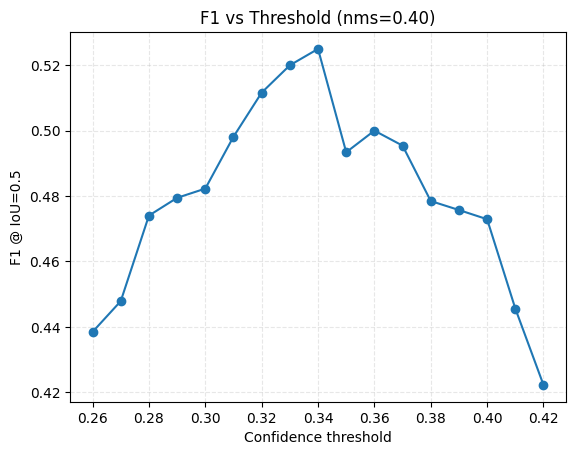

In [19]:
# Refine threshold at fixed NMS (e.g., nms=0.40) and plot F1 vs threshold
fixed_nms = 0.40  # <- update if step 1 found a better one
thr_range = np.round(np.arange(0.26, 0.42+1e-9, 0.01), 2)  # fine band around 0.34

thr_rows = []
if hasattr(model, "nms_thresh"): model.nms_thresh = float(fixed_nms)
if hasattr(model, "score_thresh"): model.score_thresh = 0.0
if hasattr(model, "detections_per_img"): model.detections_per_img = 300

for thr in thr_range:
    res = evaluate_at_threshold(model, val_loader, conf_thr=float(thr), iou_thr=0.5)
    P,R,F1,TP,FP,FN = (res[:6] if len(res)>=6 else (0,0,0,0,0,0))
    thr_rows.append((thr,P,R,F1,TP,FP,FN))
    print(f"nms={fixed_nms:.2f} thr={thr:.2f} | P={P:.3f} R={R:.3f} F1={F1:.3f}")

thr_rows = np.array(thr_rows, float)
best_i = thr_rows[:,3].argmax()
best_thr = float(thr_rows[best_i,0]); best_F1 = float(thr_rows[best_i,3])
print(f"\nBest thr at nms={fixed_nms:.2f} -> thr={best_thr:.2f}, F1={best_F1:.3f}")

plt.figure()
plt.plot(thr_rows[:,0], thr_rows[:,3], marker="o")
plt.xlabel("Confidence threshold"); plt.ylabel("F1 @ IoU=0.5"); plt.title(f"F1 vs Threshold (nms={fixed_nms:.2f})")
plt.grid(True, ls="--", alpha=0.3)
plt.show()


thr=0.34 nms=0.35 | P=0.469 R=0.629 F1=0.537
thr=0.34 nms=0.36 | P=0.459 R=0.629 F1=0.530
thr=0.34 nms=0.37 | P=0.456 R=0.639 F1=0.532
thr=0.34 nms=0.38 | P=0.453 R=0.649 F1=0.534
thr=0.34 nms=0.39 | P=0.447 R=0.649 F1=0.529
thr=0.34 nms=0.40 | P=0.441 R=0.649 F1=0.525
thr=0.34 nms=0.41 | P=0.432 R=0.649 F1=0.519
thr=0.34 nms=0.42 | P=0.429 R=0.649 F1=0.516
thr=0.34 nms=0.43 | P=0.426 R=0.649 F1=0.514
thr=0.34 nms=0.44 | P=0.409 R=0.649 F1=0.502
thr=0.34 nms=0.45 | P=0.401 R=0.649 F1=0.496
thr=0.34 nms=0.46 | P=0.396 R=0.649 F1=0.492
thr=0.34 nms=0.47 | P=0.400 R=0.660 F1=0.498
thr=0.34 nms=0.48 | P=0.395 R=0.660 F1=0.494
thr=0.34 nms=0.49 | P=0.383 R=0.660 F1=0.485
thr=0.34 nms=0.50 | P=0.370 R=0.660 F1=0.474
thr=0.34 nms=0.51 | P=0.362 R=0.660 F1=0.467
thr=0.34 nms=0.52 | P=0.358 R=0.660 F1=0.464
thr=0.34 nms=0.53 | P=0.350 R=0.660 F1=0.457
thr=0.34 nms=0.54 | P=0.350 R=0.660 F1=0.457
thr=0.34 nms=0.55 | P=0.340 R=0.660 F1=0.449

Best NMS at thr=0.34 -> nms=0.35, F1=0.537


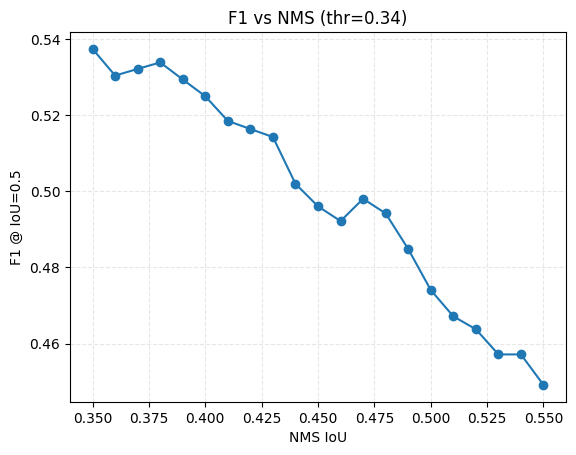

In [18]:
# Refine NMS at fixed threshold (thr=0.34) and plot F1 vs NMS
import numpy as np, matplotlib.pyplot as plt

fixed_thr = 0.34
nms_range = np.round(np.arange(0.35, 0.55+1e-9, 0.01), 2)

nms_rows = []
if hasattr(model, "score_thresh"): model.score_thresh = 0.0
if hasattr(model, "detections_per_img"): model.detections_per_img = 300

for nmsv in nms_range:
    if hasattr(model, "nms_thresh"): model.nms_thresh = float(nmsv)
    res = evaluate_at_threshold(model, val_loader, conf_thr=float(fixed_thr), iou_thr=0.5)
    P,R,F1,TP,FP,FN = (res[:6] if len(res)>=6 else (0,0,0,0,0,0))
    nms_rows.append((nmsv,P,R,F1,TP,FP,FN))
    print(f"thr={fixed_thr:.2f} nms={nmsv:.2f} | P={P:.3f} R={R:.3f} F1={F1:.3f}")

nms_rows = np.array(nms_rows, float)
best_i = nms_rows[:,3].argmax()
best_nms = float(nms_rows[best_i,0]); best_F1 = float(nms_rows[best_i,3])
print(f"\nBest NMS at thr={fixed_thr:.2f} -> nms={best_nms:.2f}, F1={best_F1:.3f}")

plt.figure()
plt.plot(nms_rows[:,0], nms_rows[:,3], marker="o")
plt.xlabel("NMS IoU"); plt.ylabel("F1 @ IoU=0.5"); plt.title(f"F1 vs NMS (thr={fixed_thr:.2f})")
plt.grid(True, ls="--", alpha=0.3)
plt.show()

In [ ]:
# --- Proof: compare a few (thr, nms) pairs @ IoU=0.5 and rank by F1 ---------------
import numpy as np, matplotlib.pyplot as plt
from collections import OrderedDict

# Make sure eval is neutral (no double-thresholding)
if hasattr(model, "score_thresh"):        model.score_thresh = 0.0
if hasattr(model, "detections_per_img"):  model.detections_per_img = 300

# Your best from the 2D grid:
BEST_THR, BEST_NMS = 0.34, 0.40

# Challengers to "prove it":
pairs = OrderedDict([
    ("best(0.34,0.40)",   (0.34, 0.40)),
    ("lower_thr(0.25)",   (0.25, 0.40)),  # lower threshold, same NMS
    ("higher_thr(0.45)",  (0.45, 0.40)),  # higher threshold, same NMS
    ("higher_nms(0.55)",  (0.34, 0.55)),  # higher NMS, same threshold
    ("lower_nms(0.35)",   (0.34, 0.35)),  # a bit lower NMS (to check the edge)
])

rows = []
for name,(thr,nms) in pairs.items():
    if hasattr(model, "nms_thresh"): model.nms_thresh = float(nms)
    res = evaluate_at_threshold(model, val_loader, conf_thr=float(thr), iou_thr=0.5)
    P,R,F1,TP,FP,FN = (res[:6] if len(res)>=6 else (0,0,0,0,0,0))
    rows.append((name, thr, nms, P, R, F1, TP, FP, FN))

# Sort by F1 (desc) and print
rows = sorted(rows, key=lambda r: r[5], reverse=True)
print("Comparison @ IoU=0.5 (sorted by F1):")
for r in rows:
    name, thr, nms, P, R, F1, TP, FP, FN = r
    print(f"{name:>16} | thr={thr:.2f} nms={nms:.2f} | P={P:.3f} R={R:.3f} F1={F1:.3f} | TP={TP} FP={FP} FN={FN}")

# Bar chart of F1
labels = [r[0] for r in rows]
f1s    = [r[5] for r in rows]
plt.figure(figsize=(8,3.5))
plt.bar(range(len(labels)), f1s)
plt.xticks(range(len(labels)), labels, rotation=35, ha="right")
plt.ylabel("F1 @ IoU=0.5"); plt.title("Operating point comparison")
plt.tight_layout()
path = (PLOTS_DIR / "operating_point_comparison.png").as_posix()
plt.savefig(path, bbox_inches="tight"); plt.show()
print("Saved:", path)


In [22]:
# Fast evaluation helpers: cache predictions once per NMS, then sweep thresholds in memory.

@torch.no_grad()
def collect_preds_for_nms(model, loader, nms_thresh, max_det=300):
    """Run model once over val set for a given NMS; return predictions + ground truths."""
    if hasattr(model, "nms_thresh"):          model.nms_thresh = float(nms_thresh)
    if hasattr(model, "score_thresh"):        model.score_thresh = 0.0   # no internal filtering
    if hasattr(model, "detections_per_img"):  model.detections_per_img = int(max_det)
    model.eval()

    preds_list, gts_list = [], []
    for images, targets, _ in loader:
        outs = model([img.to(DEVICE) for img in images])
        for i, o in enumerate(outs):
            preds_list.append({
                "boxes":  o["boxes"].detach().cpu().numpy(),
                "scores": o["scores"].detach().cpu().numpy(),
                "labels": o["labels"].detach().cpu().numpy(),
            })
            gts_list.append(targets[i]["boxes"].numpy())
    return preds_list, gts_list

def metrics_from_cache(preds_list, gts_list, conf_thr, iou_thr=0.5):
    """Compute P/R/F1 greedily from cached preds at a given threshold."""
    TP = FP = FN = 0
    for pred, gt in zip(preds_list, gts_list):
        sel = (pred["scores"] >= conf_thr) & (pred["labels"] == 1)
        boxes = pred["boxes"][sel]
        used = np.zeros(len(gt), dtype=bool)

        for b in boxes:
            best, best_j = 0.0, -1
            for j, g in enumerate(gt):
                if used[j]: continue
                # iou_xyxy assumed defined earlier
                ii = iou_xyxy(b, g)
                if ii > best: best, best_j = ii, j
            if best >= iou_thr and best_j >= 0:
                TP += 1; used[best_j] = True
            else:
                FP += 1
        FN += int((~used).sum())

    P = TP / (TP + FP) if (TP + FP) else 0.0
    R = TP / (TP + FN) if (TP + FN) else 0.0
    F1 = 2 * P * R / (P + R) if (P + R) else 0.0
    return P, R, F1, TP, FP, FN


In [23]:
# Stage 1: coarse search (few NMS x few thresholds)
candidate_nms = [0.35, 0.40, 0.45, 0.50, 0.55]
candidate_thr = [0.26, 0.30, 0.34, 0.38, 0.42]

cache = {}   # nms -> (preds_list, gts_list)
best = {"F1": -1}

for nmsv in candidate_nms:
    preds, gts = collect_preds_for_nms(model, val_loader, nmsv)
    cache[nmsv] = (preds, gts)
    for thr in candidate_thr:
        P,R,F1,TP,FP,FN = metrics_from_cache(preds, gts, thr, iou_thr=0.5)
        print(f"[coarse] nms={nmsv:.2f} thr={thr:.2f} | P={P:.3f} R={R:.3f} F1={F1:.3f}")
        if F1 > best["F1"]:
            best = {"nms": nmsv, "thr": thr, "P": P, "R": R, "F1": F1}

print("\nCoarse best:", best)

# Stage 2: fine search around the coarse best (± small window)
nms_center = best["nms"]; thr_center = best["thr"]
nms_fine = np.round(np.arange(nms_center - 0.04, nms_center + 0.041, 0.01), 2)
thr_fine = np.round(np.arange(thr_center - 0.06, thr_center + 0.061, 0.01), 2)
nms_fine = [x for x in nms_fine if 0.30 <= x <= 0.65]
thr_fine = [x for x in thr_fine if 0.05 <= x <= 0.95]

fine_best = {"F1": -1}
for nmsv in nms_fine:
    if nmsv in cache:
        preds, gts = cache[nmsv]
    else:
        preds, gts = collect_preds_for_nms(model, val_loader, nmsv)
        cache[nmsv] = (preds, gts)
    for thr in thr_fine:
        P,R,F1,TP,FP,FN = metrics_from_cache(preds, gts, thr, iou_thr=0.5)
        if F1 > fine_best["F1"]:
            fine_best = {"nms": nmsv, "thr": thr, "P": P, "R": R, "F1": F1}

print("\nFine best:", fine_best)

# Use whichever is better (coarse or fine)
final_best = fine_best if fine_best["F1"] >= best["F1"] else best
print("\nFINAL best @ IoU=0.5:", final_best)


[coarse] nms=0.35 thr=0.26 | P=0.338 R=0.742 F1=0.465
[coarse] nms=0.35 thr=0.30 | P=0.394 R=0.691 F1=0.502
[coarse] nms=0.35 thr=0.34 | P=0.469 R=0.629 F1=0.537
[coarse] nms=0.35 thr=0.38 | P=0.476 R=0.515 F1=0.495
[coarse] nms=0.35 thr=0.42 | P=0.476 R=0.402 F1=0.436
[coarse] nms=0.40 thr=0.26 | P=0.309 R=0.753 F1=0.438
[coarse] nms=0.40 thr=0.30 | P=0.368 R=0.701 F1=0.482
[coarse] nms=0.40 thr=0.34 | P=0.441 R=0.649 F1=0.525
[coarse] nms=0.40 thr=0.38 | P=0.446 R=0.515 F1=0.478
[coarse] nms=0.40 thr=0.42 | P=0.458 R=0.392 F1=0.422
[coarse] nms=0.45 thr=0.26 | P=0.273 R=0.773 F1=0.403
[coarse] nms=0.45 thr=0.30 | P=0.324 R=0.701 F1=0.443
[coarse] nms=0.45 thr=0.34 | P=0.401 R=0.649 F1=0.496
[coarse] nms=0.45 thr=0.38 | P=0.413 R=0.515 F1=0.459
[coarse] nms=0.45 thr=0.42 | P=0.432 R=0.392 F1=0.411
[coarse] nms=0.50 thr=0.26 | P=0.246 R=0.794 F1=0.376
[coarse] nms=0.50 thr=0.30 | P=0.297 R=0.722 F1=0.420
[coarse] nms=0.50 thr=0.34 | P=0.370 R=0.660 F1=0.474
[coarse] nms=0.50 thr=0.38 |

In [24]:
INFER_THR = final_best["thr"]
INFER_NMS = final_best["nms"]
MAX_DET   = 50

if hasattr(model, "score_thresh"):        model.score_thresh       = float(INFER_THR)
if hasattr(model, "nms_thresh"):          model.nms_thresh         = float(INFER_NMS)
if hasattr(model, "detections_per_img"):  model.detections_per_img = MAX_DET

infer_and_save_folder(model, images_dir=IMAGES_DIR, score_thr=INFER_THR, tta=False)


Saved 40 predictions to: C:\Users\bweil\projects\ripe-strawberry-detector\output_improved\preds


In [25]:
# --- Qualitative proof: side-by-side for a few val images -----------------------
from PIL import Image, ImageDraw

BEST_THR, BEST_NMS = 0.34, 0.40
LOWER_THR, SAME_NMS = 0.25, 0.40
HIGH_NMS, SAME_THR  = 0.55, 0.34

COMPARE_DIR = (OUTPUT_DIR / "compare"); COMPARE_DIR.mkdir(exist_ok=True, parents=True)

def _set_infer(thr, nms, max_det=50):
    if hasattr(model,"score_thresh"):        model.score_thresh = float(thr)
    if hasattr(model,"nms_thresh"):          model.nms_thresh   = float(nms)
    if hasattr(model,"detections_per_img"):  model.detections_per_img = int(max_det)

@torch.no_grad()
def _predict(model, img_t, thr):
    model.eval()
    out = model(img_t.unsqueeze(0).to(DEVICE))[0]
    boxes  = out["boxes"].cpu(); scores = out["scores"].cpu(); labels = out["labels"].cpu()
    sel = scores >= thr
    return boxes[sel], scores[sel], labels[sel]

def _draw(pil_img, boxes, scores, labels, color):
    d = ImageDraw.Draw(pil_img)
    for i in range(len(boxes)):
        x1,y1,x2,y2 = boxes[i].tolist()
        s = float(scores[i])
        d.rectangle([x1,y1,x2,y2], outline=color, width=2)
        d.text((x1, max(0,y1-12)), f"{s:.2f}", fill=color)
    return pil_img

def compare_three(images_to_show=4):
    shown = 0
    for images, targets, paths in val_loader:
        for i in range(len(images)):
            pil = T.ToPILImage()(images[i])
            ten = images[i]

            # best
            _set_infer(BEST_THR, BEST_NMS)
            b1,s1,l1 = _predict(model, ten, BEST_THR)
            im1 = _draw(pil.copy(), b1, s1, l1, (255,0,0))

            # lower threshold (more boxes expected)
            _set_infer(LOWER_THR, SAME_NMS)
            b2,s2,l2 = _predict(model, ten, LOWER_THR)
            im2 = _draw(pil.copy(), b2, s2, l2, (0,128,0))

            # higher NMS (may merge neighbors / leave duplicates)
            _set_infer(SAME_THR, HIGH_NMS)
            b3,s3,l3 = _predict(model, ten, SAME_THR)
            im3 = _draw(pil.copy(), b3, s3, l3, (0,0,255))

            # stitch row: [best | lower_thr | higher_nms]
            w,h = pil.size
            canvas = Image.new("RGB", (w*3, h), (255,255,255))
            canvas.paste(im1, (0,0))
            canvas.paste(im2, (w,0))
            canvas.paste(im3, (w*2,0))
            out_path = COMPARE_DIR / f"{paths[i].stem}_cmp.png"
            canvas.save(out_path)
            print(f"Saved: {out_path.name} | best={len(b1)} boxes, lower_thr={len(b2)}, higher_nms={len(b3)}")

            shown += 1
            if shown >= images_to_show:
                return

compare_three(images_to_show=6)
print("Side-by-side images saved to:", COMPARE_DIR)


Saved: 12_cmp.png | best=12 boxes, lower_thr=26, higher_nms=18
Saved: 2_cmp.png | best=15 boxes, lower_thr=25, higher_nms=15
Saved: 22_cmp.png | best=5 boxes, lower_thr=13, higher_nms=5
Saved: 23_cmp.png | best=44 boxes, lower_thr=50, higher_nms=50
Saved: 26_cmp.png | best=19 boxes, lower_thr=33, higher_nms=25
Saved: 32_cmp.png | best=16 boxes, lower_thr=30, higher_nms=20
Side-by-side images saved to: C:\Users\bweil\projects\ripe-strawberry-detector\output_improved\compare


In [26]:
# --- Fast operating point comparison (IoU=0.5), with true inference + caps ---
import time, torch
from collections import OrderedDict

# 0) Ensure proper eval mode + light post-processing
model.eval()
if hasattr(model, "score_thresh"):        model.score_thresh = 0.0
if hasattr(model, "detections_per_img"):  model.detections_per_img = 100  # lower for speed

BEST_THR, BEST_NMS = 0.34, 0.40
pairs = OrderedDict([
    ("best(0.34,0.40)",   (0.34, 0.40)),
    ("lower_thr(0.25)",   (0.25, 0.40)),
    ("higher_thr(0.45)",  (0.45, 0.40)),
    ("higher_nms(0.55)",  (0.34, 0.55)),
    ("lower_nms(0.35)",  (0.34, 0.35)),
])

# 1) Optional: cap how many val images to use for *ranking* (keeps results consistent but fast)
MAX_EVAL_IMAGES = 200  # set to None to use full val set

def eval_quick(model, loader, conf_thr, nms_thr, iou_thr=0.5, max_images=MAX_EVAL_IMAGES):
    """Minimal wrapper around your evaluate_at_threshold that:
       - uses inference_mode (no grad)
       - iterates only a subset if requested
    """
    # If your evaluate_at_threshold already loops loader internally, we just call it here.
    # But we still set thresholds on the model and ensure inference_mode.
    if hasattr(model, "nms_thresh"):
        model.nms_thresh = float(nms_thr)

    start = time.time()
    with torch.inference_mode():
        # If your function accepts the full loader, just pass it.
        # If it accepts raw tensors, adapt as needed.
        P,R,F1,TP,FP,FN,*rest = evaluate_at_threshold(
            model, 
            loader if max_images is None else itertools.islice(loader, 0, max_images),
            conf_thr=float(conf_thr),
            iou_thr=float(iou_thr)
        )
    dt = time.time() - start
    return dict(P=P, R=R, F1=F1, TP=TP, FP=FP, FN=FN, sec=dt)

# 2) Run
import itertools
rows = []
print(f"Evaluating up to {MAX_EVAL_IMAGES or 'ALL'} images per pair with IoU=0.5 ...")
for name,(thr,nms) in pairs.items():
    m = eval_quick(model, val_loader, thr, nms, iou_thr=0.5, max_images=MAX_EVAL_IMAGES)
    rows.append((name, thr, nms, m['P'], m['R'], m['F1'], m['TP'], m['FP'], m['FN'], m['sec']))
    print(f"{name:>16} | thr={thr:.2f} nms={nms:.2f} | "
          f"P={m['P']:.3f} R={m['R']:.3f} F1={m['F1']:.3f} | "
          f"TP={m['TP']} FP={m['FP']} FN={m['FN']} | {m['sec']:.1f}s")

# 3) Sort and plot
rows = sorted(rows, key=lambda r: r[5], reverse=True)

# (Optional) quick bar chart without blocking the run
import matplotlib.pyplot as plt
labels = [r[0] for r in rows]
f1s    = [r[5] for r in rows]
plt.figure(figsize=(8,3.5))
plt.bar(range(len(labels)), f1s)
plt.xticks(range(len(labels)), labels, rotation=35, ha="right")
plt.ylabel("F1 @ IoU=0.5"); plt.title("Operating point comparison (capped)")
plt.tight_layout()
path = (PLOTS_DIR / "operating_point_comparison_fast.png").as_posix()
plt.savefig(path, bbox_inches="tight"); plt.close()
print("Saved:", path)

print("\nSorted by F1 (desc):")
for r in rows:
    name, thr, nms, P, R, F1, TP, FP, FN, sec = r
    print(f"{name:>16} | thr={thr:.2f} nms={nms:.2f} | F1={F1:.3f} (P={P:.3f}, R={R:.3f}) | time={sec:.1f}s")


Evaluating up to 200 images per pair with IoU=0.5 ...
 best(0.34,0.40) | thr=0.34 nms=0.40 | P=0.441 R=0.649 F1=0.525 | TP=63 FP=80 FN=34 | 27.7s
 lower_thr(0.25) | thr=0.25 nms=0.40 | P=0.292 R=0.763 F1=0.423 | TP=74 FP=179 FN=23 | 26.0s
higher_thr(0.45) | thr=0.45 nms=0.40 | P=0.485 R=0.340 F1=0.400 | TP=33 FP=35 FN=64 | 22.2s
higher_nms(0.55) | thr=0.34 nms=0.55 | P=0.340 R=0.660 F1=0.449 | TP=64 FP=124 FN=33 | 30.4s
 lower_nms(0.35) | thr=0.34 nms=0.35 | P=0.469 R=0.629 F1=0.537 | TP=61 FP=69 FN=36 | 31.1s
Saved: C:/Users/bweil/projects/ripe-strawberry-detector/output_improved/plots/operating_point_comparison_fast.png

Sorted by F1 (desc):
 lower_nms(0.35) | thr=0.34 nms=0.35 | F1=0.537 (P=0.469, R=0.629) | time=31.1s
 best(0.34,0.40) | thr=0.34 nms=0.40 | F1=0.525 (P=0.441, R=0.649) | time=27.7s
higher_nms(0.55) | thr=0.34 nms=0.55 | F1=0.449 (P=0.340, R=0.660) | time=30.4s
 lower_thr(0.25) | thr=0.25 nms=0.40 | F1=0.423 (P=0.292, R=0.763) | time=26.0s
higher_thr(0.45) | thr=0.45 

In [27]:
# --- Fine NMS sweep @ fixed thr=0.34 (no caps, accurate) ---
import numpy as np, time
import torch

# Neutralize internal filters for eval
model.eval()
if hasattr(model, "score_thresh"):        model.score_thresh = 0.0
if hasattr(model, "detections_per_img"):  model.detections_per_img = 300  # high cap
# (nms will be set per-try below)

@torch.no_grad()
def collect_preds_for_nms(model, loader, nms_thresh, max_det=300):
    if hasattr(model, "nms_thresh"):          model.nms_thresh = float(nms_thresh)
    if hasattr(model, "detections_per_img"):  model.detections_per_img = int(max_det)
    outs_list, gts_list = [], []
    for images, targets, _ in loader:
        outs = model([img.to(DEVICE) for img in images])
        for i, o in enumerate(outs):
            outs_list.append({
                "boxes":  o["boxes"].detach().cpu().numpy(),
                "scores": o["scores"].detach().cpu().numpy(),
                "labels": o["labels"].detach().cpu().numpy(),
            })
            gts_list.append(targets[i]["boxes"].numpy())
    return outs_list, gts_list

def iou_xyxy(a, b):
    xA=max(a[0],b[0]); yA=max(a[1],b[1])
    xB=min(a[2],b[2]); yB=min(a[3],b[3])
    inter=max(0,xB-xA)*max(0,yB-yA)
    if inter<=0: return 0.0
    areaA=max(0,a[2]-a[0])*max(0,a[3]-a[1]); areaB=max(0,b[2]-b[0])*max(0,b[3]-b[1])
    uni=areaA+areaB-inter
    return 0.0 if uni<=0 else inter/uni

def metrics_from_cache(preds_list, gts_list, conf_thr, iou_thr=0.5):
    TP=FP=FN=0
    for pred, gt in zip(preds_list, gts_list):
        sel = (pred["scores"] >= conf_thr) & (pred["labels"] == 1)
        boxes = pred["boxes"][sel]
        used = np.zeros(len(gt), dtype=bool)
        for b in boxes:
            best, best_j = 0.0, -1
            for j, g in enumerate(gt):
                if used[j]: continue
                ii = iou_xyxy(b, g)
                if ii > best: best, best_j = ii, j
            if best >= iou_thr and best_j >= 0:
                TP += 1; used[best_j] = True
            else:
                FP += 1
        FN += int((~used).sum())
    P = TP / (TP + FP) if (TP + FP) else 0.0
    R = TP / (TP + FN) if (TP + FN) else 0.0
    F1 = 2 * P * R / (P + R) if (P + R) else 0.0
    return P, R, F1, TP, FP, FN

fixed_thr = 0.34
nms_vals  = np.round(np.arange(0.33, 0.45 + 1e-9, 0.01), 2)

best = {"F1": -1}
rows = []
for nmsv in nms_vals:
    preds, gts = collect_preds_for_nms(model, val_loader, nmsv)
    P,R,F1,TP,FP,FN = metrics_from_cache(preds, gts, fixed_thr, iou_thr=0.5)
    rows.append((nmsv, P, R, F1, TP, FP, FN))
    print(f"thr={fixed_thr:.2f} nms={nmsv:.2f} | P={P:.3f} R={R:.3f} F1={F1:.3f} | TP={TP} FP={FP} FN={FN}")
    if F1 > best["F1"]:
        best = {"nms": float(nmsv), "thr": fixed_thr, "P": P, "R": R, "F1": F1}

rows = sorted(rows, key=lambda r: r[3], reverse=True)
print("\nFine-NMS best:", best)


thr=0.34 nms=0.33 | P=0.477 R=0.629 F1=0.542 | TP=61 FP=67 FN=36
thr=0.34 nms=0.34 | P=0.477 R=0.629 F1=0.542 | TP=61 FP=67 FN=36
thr=0.34 nms=0.35 | P=0.469 R=0.629 F1=0.537 | TP=61 FP=69 FN=36
thr=0.34 nms=0.36 | P=0.459 R=0.629 F1=0.530 | TP=61 FP=72 FN=36
thr=0.34 nms=0.37 | P=0.456 R=0.639 F1=0.532 | TP=62 FP=74 FN=35
thr=0.34 nms=0.38 | P=0.453 R=0.649 F1=0.534 | TP=63 FP=76 FN=34
thr=0.34 nms=0.39 | P=0.447 R=0.649 F1=0.529 | TP=63 FP=78 FN=34
thr=0.34 nms=0.40 | P=0.441 R=0.649 F1=0.525 | TP=63 FP=80 FN=34
thr=0.34 nms=0.41 | P=0.432 R=0.649 F1=0.519 | TP=63 FP=83 FN=34
thr=0.34 nms=0.42 | P=0.429 R=0.649 F1=0.516 | TP=63 FP=84 FN=34
thr=0.34 nms=0.43 | P=0.426 R=0.649 F1=0.514 | TP=63 FP=85 FN=34
thr=0.34 nms=0.44 | P=0.409 R=0.649 F1=0.502 | TP=63 FP=91 FN=34
thr=0.34 nms=0.45 | P=0.401 R=0.649 F1=0.496 | TP=63 FP=94 FN=34

Fine-NMS best: {'nms': 0.33, 'thr': 0.34, 'P': 0.4765625, 'R': 0.6288659793814433, 'F1': 0.5422222222222223}


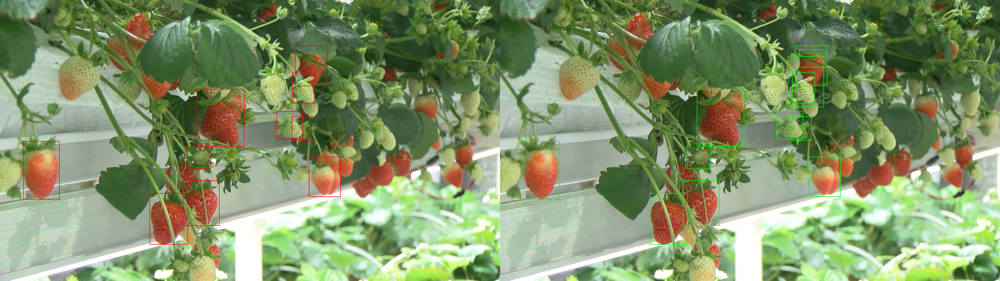

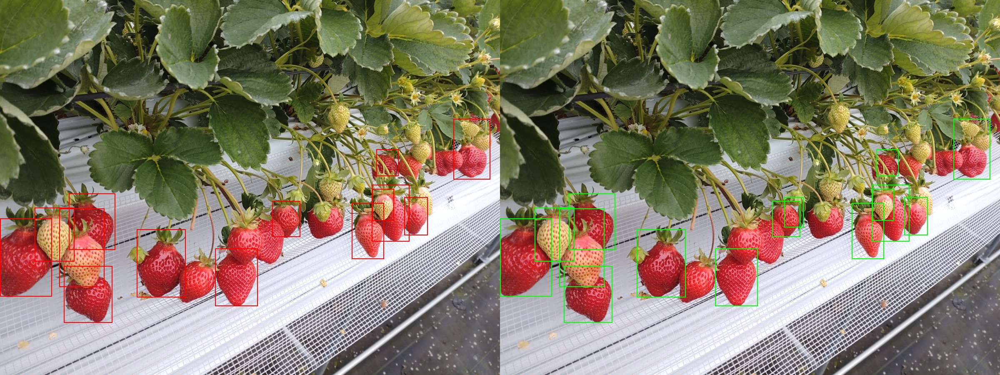

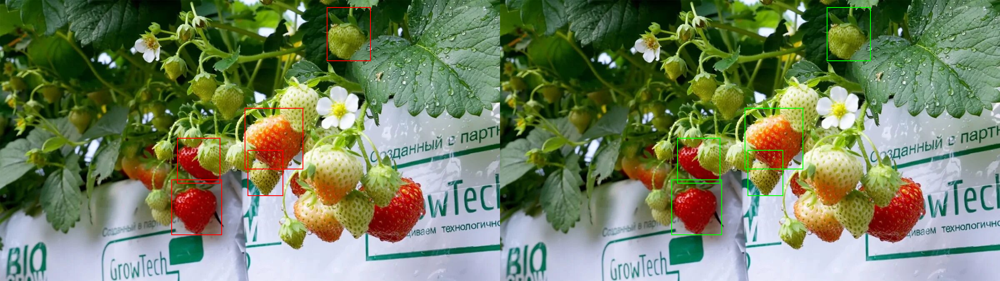

In [28]:
# Quick side-by-side: thr=0.34 with NMS 0.35 vs 0.40
from PIL import Image, ImageDraw

def _set(thr,nms):
    if hasattr(model,"score_thresh"):        model.score_thresh = float(thr)
    if hasattr(model,"nms_thresh"):          model.nms_thresh   = float(nms)
    if hasattr(model,"detections_per_img"):  model.detections_per_img = 100

@torch.no_grad()
def _pred(img_t, thr):
    out = model(img_t.unsqueeze(0).to(DEVICE))[0]
    boxes=out["boxes"].cpu(); scores=out["scores"].cpu(); labels=out["labels"].cpu()
    sel = scores >= thr
    return boxes[sel], scores[sel], labels[sel]

def _draw(pil, boxes, scores, color):
    d = ImageDraw.Draw(pil)
    for i in range(len(boxes)):
        x1,y1,x2,y2 = boxes[i].tolist()
        d.rectangle([x1,y1,x2,y2], outline=color, width=2)
    return pil

shown = 0
for images, targets, paths in val_loader:
    for i in range(len(images)):
        pil = T.ToPILImage()(images[i]); ten = images[i]
        # NMS 0.35
        _set(0.34, 0.35); b1,s1,_ = _pred(ten, 0.34); im1 = _draw(pil.copy(), b1, s1, (255,0,0))
        # NMS 0.40
        _set(0.34, 0.40); b2,s2,_ = _pred(ten, 0.34); im2 = _draw(pil.copy(), b2, s2, (0,255,0))

        canvas = Image.new("RGB", (pil.width*2, pil.height), (255,255,255))
        canvas.paste(im1, (0,0)); canvas.paste(im2, (pil.width,0))
        display(canvas)  # or save if you prefer
        shown += 1
        if shown >= 3: break
    if shown >= 3: break


Best @ NMS 0.34: {'nms': 0.34, 'thr': 0.34, 'F1': 0.5422222222222223}
Best @ NMS 0.40: {'nms': 0.4, 'thr': 0.34, 'F1': 0.525}
thr=0.30 | F1(NMS=0.34)=0.510 vs F1(NMS=0.40)=0.482 | Δ=+0.027
thr=0.34 | F1(NMS=0.34)=0.542 vs F1(NMS=0.40)=0.525 | Δ=+0.017
thr=0.38 | F1(NMS=0.34)=0.495 vs F1(NMS=0.40)=0.478 | Δ=+0.017
thr=0.42 | F1(NMS=0.34)=0.436 vs F1(NMS=0.40)=0.422 | Δ=+0.014


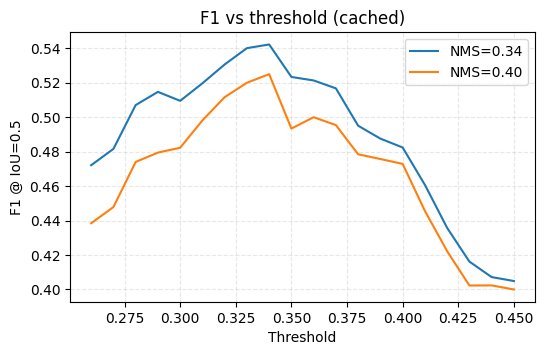

Saved: C:/Users/bweil/projects/ripe-strawberry-detector/output_improved/plots/f1_vs_thr_cached_nms034_vs_040.png


In [30]:
# === Ultra-fast F1 vs threshold: NMS 0.34 vs 0.40 (cache once, sweep in memory) ===
import numpy as np, matplotlib.pyplot as plt
import torch

# --- make sure eval is neutral (no double-thresholding) ---
model.eval()
if hasattr(model, "score_thresh"):        model.score_thresh = 0.0
if hasattr(model, "detections_per_img"):  model.detections_per_img = 300  # high cap for accurate eval

# --- fallback helpers if not already defined elsewhere ---
@torch.no_grad()
def _collect_preds_for_nms(model, loader, nms_thresh, max_det=300):
    if hasattr(model, "nms_thresh"):          model.nms_thresh = float(nms_thresh)
    if hasattr(model, "detections_per_img"):  model.detections_per_img = int(max_det)
    outs_list, gts_list = [], []
    for images, targets, _ in loader:
        outs = model([img.to(DEVICE) for img in images])
        for i, o in enumerate(outs):
            outs_list.append({
                "boxes":  o["boxes"].detach().cpu().numpy(),
                "scores": o["scores"].detach().cpu().numpy(),
                "labels": o["labels"].detach().cpu().numpy(),
            })
            gts_list.append(targets[i]["boxes"].numpy())
    return outs_list, gts_list

def _iou_xyxy(a, b):
    xA=max(a[0],b[0]); yA=max(a[1],b[1])
    xB=min(a[2],b[2]); yB=min(a[3],b[3])
    inter=max(0,xB-xA)*max(0,yB-yA)
    if inter<=0: return 0.0
    areaA=max(0,a[2]-a[0])*max(0,a[3]-a[1])
    areaB=max(0,b[2]-b[0])*max(0,b[3]-b[1])
    union=areaA+areaB-inter
    return 0.0 if union<=0 else inter/union

def _metrics_from_cache(preds_list, gts_list, conf_thr, iou_thr=0.5):
    TP=FP=FN=0
    for pred, gt in zip(preds_list, gts_list):
        sel = (pred["scores"] >= conf_thr) & (pred["labels"] == 1)
        boxes = pred["boxes"][sel]
        used = np.zeros(len(gt), dtype=bool)
        for b in boxes:
            best, jbest = 0.0, -1
            for j, g in enumerate(gt):
                if used[j]: continue
                ii = _iou_xyxy(b, g)
                if ii > best: best, jbest = ii, j
            if best >= iou_thr and jbest >= 0:
                TP += 1; used[jbest] = True
            else:
                FP += 1
        FN += int((~used).sum())
    P = TP/(TP+FP) if (TP+FP) else 0.0
    R = TP/(TP+FN) if (TP+FN) else 0.0
    F1 = 2*P*R/(P+R) if (P+R) else 0.0
    return P,R,F1,TP,FP,FN

# --- cache preds once per NMS ---
NMS_A, NMS_B = 0.34, 0.40
preds_A, gts = _collect_preds_for_nms(model, val_loader, NMS_A)
preds_B, _   = _collect_preds_for_nms(model, val_loader, NMS_B)  # same GT order

# --- sweep thresholds in memory ---
thr_range = np.round(np.arange(0.26, 0.45+1e-9, 0.01), 2)
f1_A, f1_B = [], []
for t in thr_range:
    _,_,F1A,_,_,_ = _metrics_from_cache(preds_A, gts, t, iou_thr=0.5)
    _,_,F1B,_,_,_ = _metrics_from_cache(preds_B, gts, t, iou_thr=0.5)
    f1_A.append(F1A); f1_B.append(F1B)
f1_A, f1_B = np.array(f1_A), np.array(f1_B)

# --- best per curve ---
iA = f1_A.argmax(); iB = f1_B.argmax()
best_A = {"nms": NMS_A, "thr": float(thr_range[iA]), "F1": float(f1_A[iA])}
best_B = {"nms": NMS_B, "thr": float(thr_range[iB]), "F1": float(f1_B[iB])}
print("Best @ NMS 0.34:", best_A)
print("Best @ NMS 0.40:", best_B)

# --- tiny head-to-head at a few thresholds (0.30, 0.34, 0.38, 0.42) ---
for t in [0.30, 0.34, 0.38, 0.42]:
    _,_,fa,_,_,_ = _metrics_from_cache(preds_A, gts, t, iou_thr=0.5)
    _,_,fb,_,_,_ = _metrics_from_cache(preds_B, gts, t, iou_thr=0.5)
    print(f"thr={t:.2f} | F1(NMS=0.34)={fa:.3f} vs F1(NMS=0.40)={fb:.3f} | Δ={fa-fb:+.3f}")

# --- plot (and save) ---
plt.figure(figsize=(6,3.5))
plt.plot(thr_range, f1_A, label=f"NMS={NMS_A:.2f}")
plt.plot(thr_range, f1_B, label=f"NMS={NMS_B:.2f}")
plt.xlabel("Threshold"); plt.ylabel("F1 @ IoU=0.5"); plt.title("F1 vs threshold (cached)")
plt.grid(True, ls="--", alpha=0.3); plt.legend()
path = (PLOTS_DIR / "f1_vs_thr_cached_nms034_vs_040.png").as_posix()
plt.savefig(path, bbox_inches="tight"); plt.show()
print("Saved:", path)

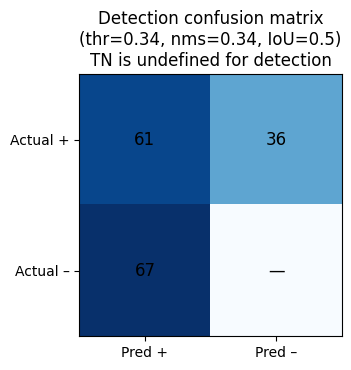

TP=61, FP=67, FN=36 | Precision=0.477, Recall=0.629, F1=0.542
Saved: C:/Users/bweil/projects/ripe-strawberry-detector/output_improved/plots/confusion_matrix_iou05_thr034_nms034.png


In [31]:
# --- Detection "confusion matrix" @ IoU=0.5, thr=0.34, nms=0.34 ----------------
import numpy as np, matplotlib.pyplot as plt, torch

# 1) Neutralize internal filtering for evaluation (threshold is applied externally)
model.eval()
if hasattr(model, "score_thresh"):        model.score_thresh = 0.0
if hasattr(model, "nms_thresh"):          model.nms_thresh   = 0.34
if hasattr(model, "detections_per_img"):  model.detections_per_img = 300

# 2) Evaluate to get TP/FP/FN
res = evaluate_at_threshold(model, val_loader, conf_thr=0.34, iou_thr=0.5)
if isinstance(res, tuple) and len(res) >= 6:
    P,R,F1,TP,FP,FN = res[:6]
else:
    raise RuntimeError("evaluate_at_threshold did not return the expected values.")

# 3) Build a 2x2 matrix (TN undefined for detection)
# Rows = Actual {Positive, Negative}; Cols = Pred {Positive, Negative}
cm = np.array([[TP, FN],
               [FP, np.nan]], dtype=float)

fig, ax = plt.subplots(figsize=(4.5,3.8))
im = ax.imshow(np.nan_to_num(cm, nan=0.0), cmap="Blues")

# annotate
for i in range(2):
    for j in range(2):
        txt = "—" if np.isnan(cm[i,j]) else f"{int(cm[i,j])}"
        ax.text(j, i, txt, ha="center", va="center", fontsize=12, color="black")

ax.set_xticks([0,1]); ax.set_xticklabels(["Pred +", "Pred –"])
ax.set_yticks([0,1]); ax.set_yticklabels(["Actual +", "Actual –"])
ax.set_title("Detection confusion matrix\n(thr=0.34, nms=0.34, IoU=0.5)\nTN is undefined for detection")

plt.tight_layout()
out_path = (PLOTS_DIR / "confusion_matrix_iou05_thr034_nms034.png").as_posix()
plt.savefig(out_path, bbox_inches="tight"); plt.show()

print(f"TP={TP}, FP={FP}, FN={FN} | Precision={P:.3f}, Recall={R:.3f}, F1={F1:.3f}")
print("Saved:", out_path)


## 6) Inference calibration + batch inference (no TTA while tuning)

In [34]:
# Use best from sweep or grid-search
INFER_THR = 0.34
INFER_NMS = 0.34
MAX_DET   = 50

if hasattr(model,"score_thresh"):        model.score_thresh=INFER_THR
if hasattr(model,"nms_thresh"):          model.nms_thresh=INFER_NMS
if hasattr(model,"detections_per_img"):  model.detections_per_img=MAX_DET
print("Inference settings:", INFER_THR, INFER_NMS, MAX_DET)

def draw_boxes(pil_img, boxes, scores, labels, color=(255,0,0)):
    d = ImageDraw.Draw(pil_img)
    for i in range(len(boxes)):
        x1,y1,x2,y2 = boxes[i].tolist()
        s = float(scores[i]); cls = int(labels[i])
        d.rectangle([x1,y1,x2,y2], outline=color, width=2)
        d.text((x1, max(0,y1-12)), f"{CLASS_NAME.get(cls,'cls')} {s:.2f}", fill=color)
    return pil_img

@torch.no_grad()
def predict_single(model, image, score_thr=0.5, tta=False):
    model.eval()
    out = model(image.unsqueeze(0).to(DEVICE))[0]
    boxes  = out["boxes"].cpu(); scores = out["scores"].cpu(); labels = out["labels"].cpu()
    sel = scores >= score_thr
    return boxes[sel], scores[sel], labels[sel]

def infer_and_save_folder(model, images_dir=IMAGES_DIR, score_thr=INFER_THR, tta=False, limit=None):
    imgs = sorted([p for p in Path(images_dir).glob("*") if p.suffix.lower() in [".jpg",".jpeg",".png",".bmp"]])
    if limit: imgs = imgs[:limit]
    for p in imgs:
        pil = Image.open(p).convert("RGB")
        ten = T.ToTensor()(pil)
        b,s,l = predict_single(model, ten, score_thr=score_thr, tta=tta)
        out = pil.copy(); out = draw_boxes(out, b, s, l, color=(0,255,0) if tta else (255,0,0))
        dst = PREDS_DIR / f"{p.stem}_pred.png"; out.save(dst)
    print(f"Saved {len(imgs)} predictions to:", PREDS_DIR)

infer_and_save_folder(model, images_dir=IMAGES_DIR, score_thr=INFER_THR, tta=False)


Inference settings: 0.34 0.34 50
Saved 40 predictions to: C:\Users\bweil\projects\ripe-strawberry-detector\output_improved\preds
